In [1]:
%autoreload 2 
%matplotlib inline

In [3]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

In [ ]:
from __future__ import division

In [48]:
path = "../../data/"
import pandas as pd
offset_df = pd.read_hdf(path + "offset_stat_129.h5", "df")

In [66]:
shrink_df = pd.read_hdf(path + "offset_stat_129.h5", "shrink_df")

In [6]:
import cPickle 
import matplotlib.pyplot as plt
import sys; sys.path.append("../")
import h5py

In [17]:
import plot_gal_prop as pg 
import extract_catalog as ec
import get_gal_centroids as get_gal 

In [7]:
f = h5py.File(path + 
              "Illustris-1_fof_subhalo_myCompleteHaloCatalog_00135.hdf5", 
              "r'")

In [8]:
# fhat_list = cPickle.load(open(path + 'fhat_I_lum.pkl'))

In [20]:
R200C = f["Group"]['Group_R_Crit200'][:129]

In [37]:
df_list = map(lambda x: ec.extract_clst(f, x), range(129))  # get main df 

In [110]:
bright_gal_ixes = map(lambda x: 
                      get_gal.get_BCG_ix(x, brightest_only=False), 
                      df_list)

## find clusters with > 1 BCGs 

In [124]:
two_gal_ixes = [i for i in range(129) if len(bright_gal_ixes[i]) != 1]

# Examine all peaks and I band luminosity maps

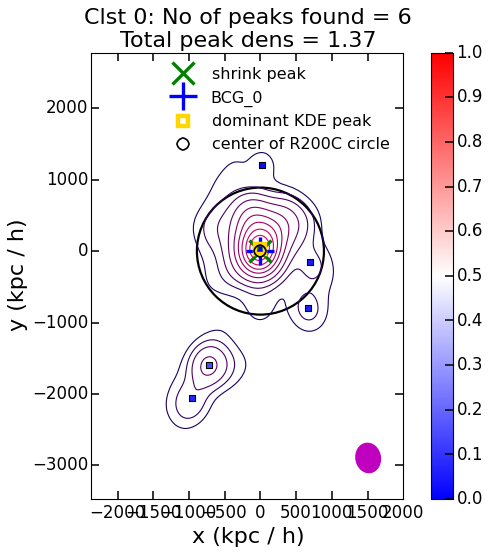

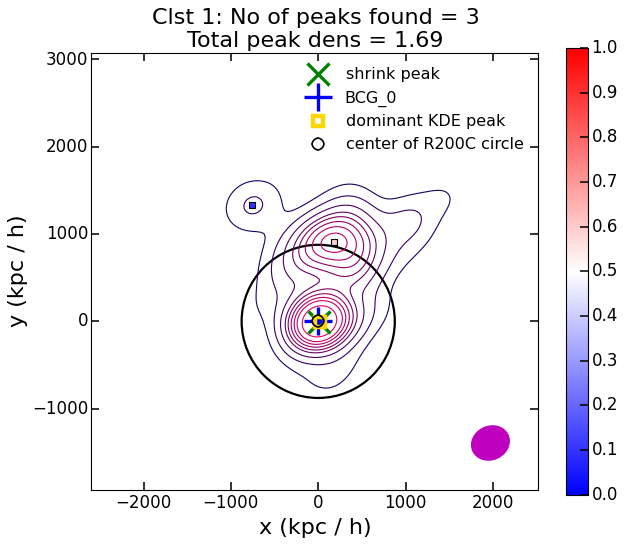

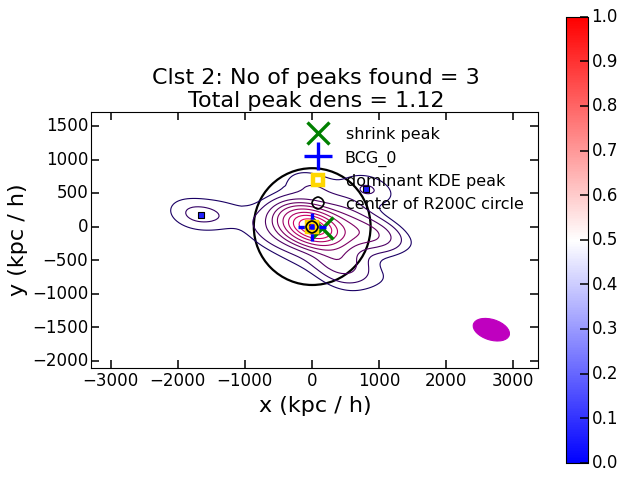

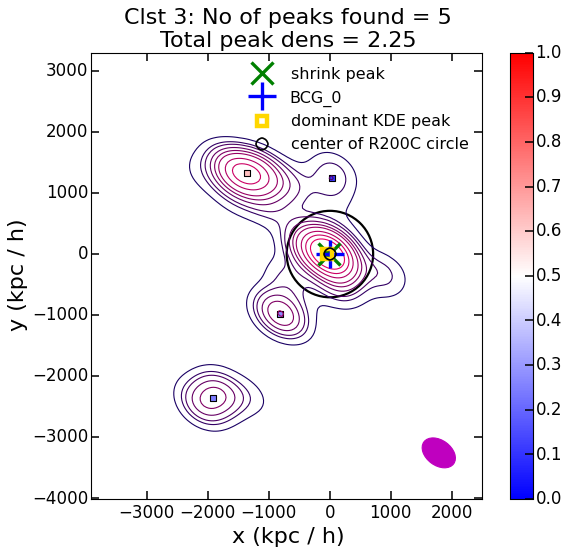

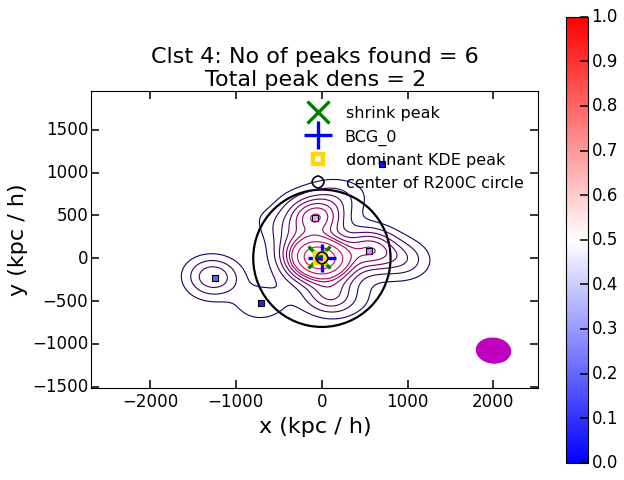

...

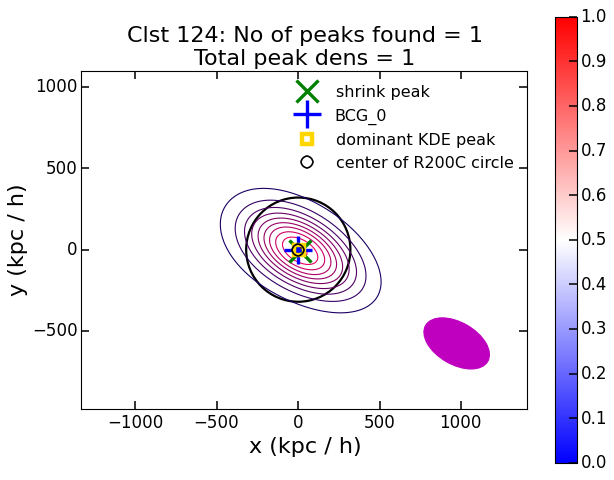

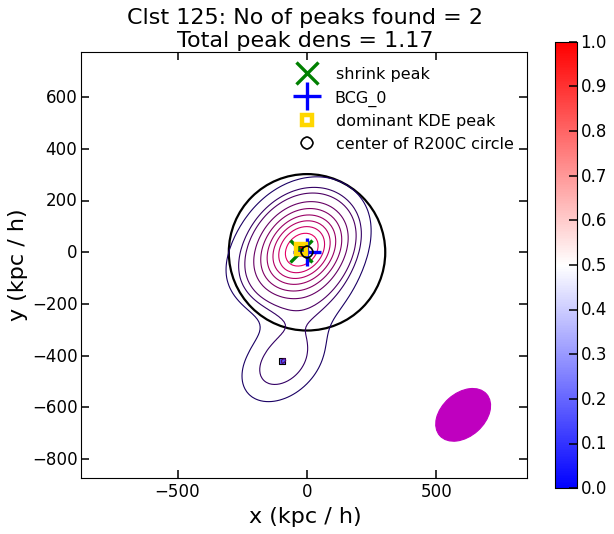

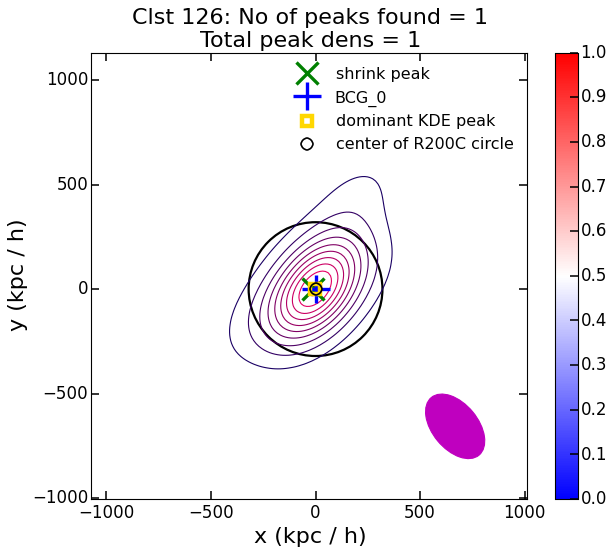

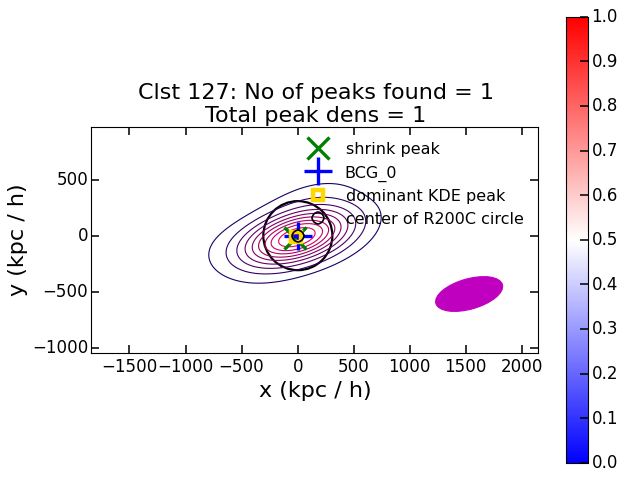

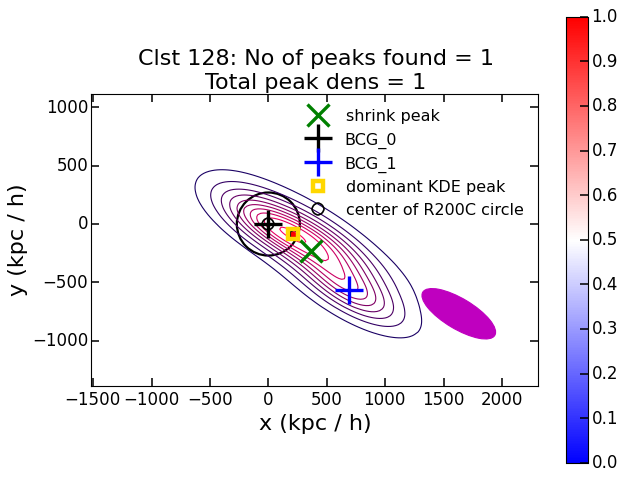

In [121]:
for i in range(129):
    fig = plt.figure()
    ax = fig.add_subplot(111, aspect='equal')
    
    ax.plot(shrink_df.I_band_lum_shrink_peak0[i],
            shrink_df.I_band_lum_shrink_peak1[i], 'x',
            color='g', mew=3, label='shrink peak',
            ms=20)
    for j, bcg_ix in enumerate(bright_gal_ixes[i]):
        ax.plot(df_list[i].SubhaloPos0[bcg_ix], 
                df_list[i].SubhaloPos1[bcg_ix], '+', 
                color=(0., 0., (j + 1)/ len(bright_gal_ixes[i])), mew=3, 
                label='BCG_{0}'.format(j),
                ms=25)
    
    pg.plot_KDE_peaks(fhat_list[i], allPeaks=True, 
                      R200C=R200C[i], showData=True,
                      clstNo=i, ax=ax, fig=fig)
    
    plt.close()